# The study of the results of running the algorithm on transfermarket-2008_2023 dataset: <br>

`input_directory`:  `data/input/real_data/transfermarket`<br>
`output_directory`: `data/output/5-fold_cv/real_data/transfermarket`<br>
`input_file`:       `adjacency_2008_23.dat` which contains the transfer data from 2008 to 2023 in 5 time snapshots<br>
`input`:            "`theta_adjacency_2008_23_K8_cv.npz`"  contains the community membership resulting from the MT algorithm. <br>
**`K`: The number of communities (8) is determined from the cross-validation results of the MT algorithm.** 
 

In [1]:
from analyze_transfermarkt import transfermarkt_utils as ttl
import Dyn_ACD_wtemp
import cv_functions as cv
import tools_temp as tlm

import networkx as nx
import pandas as pd
import os

import numpy as np   
import random as rdm
import importlib
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict
import matplotlib.pylab as pylab
import json

%matplotlib inline

In [2]:
pd.set_option('display.max_rows', 150)

In [3]:
sns_setting = False
if sns_setting:     
    sns.set_theme() 
    sns.axes_style('white') 
    custom_params = {"axes.spines.right": True, "axes.spines.top": True}
    sns.set_theme(style="ticks", rc=custom_params, font_scale=1.0, palette="tab20")  
    sns.set_context("talk")# Option: "paper","notebook","talk","poster",the later the bigger.
    sns.set_theme(style="ticks", rc={"font.size": 26, "font.family": ['sans-serif'], "font.sans-serif": ['Helvetica']})

# Import metadata

In [4]:
df_meta = ttl.import_metadata()
df_meta.head(n=5)

,node,fee_spent,fee_received,spent_over_received,team_city,coordinates,lat,lon
0,AC_Ajaccio,32.0,16.0,2.000000,Ajaccio,"[41.9195, 8.7382]",41.9195,8.7382
1,AC_Amiens,41.0,54.0,0.759259,Amiens,"[49.8941, 2.3028]",49.8941,2.3028
2,AC_Cesena,43.0,70.0,0.614286,Cesena,"[44.1391, 12.2436]",44.1391,12.2436
3,AC_Fiorentina,575.0,544.0,1.056985,Florence,"[43.7696, 11.2558]",43.7696,11.2558
4,AC_Le_Havre,6.0,72.0,0.083333,Le Havre,"[49.4944, 0.107]",49.4944,0.1070


### Plot in and out transfer fees

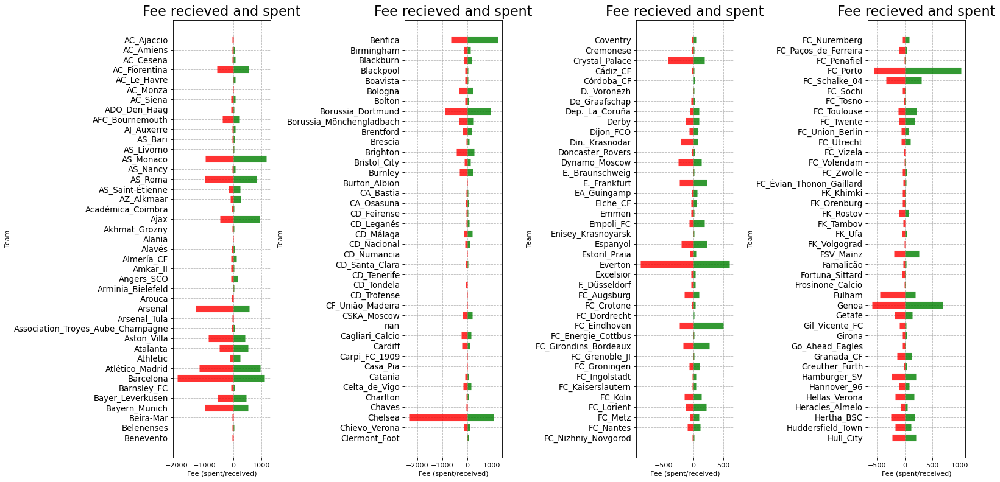

In [5]:
L = 4
alpha = 0.8
lw = 10
n_max = 40
plt.figure(figsize=(20,10), dpi= 80)

plt.subplot(1,L,1)

plt.hlines(y=df_meta.index[:n_max+1], xmin=-df_meta.fee_spent.iloc[n_max::-1], xmax=0, color='r', alpha=alpha, linewidth=lw)
plt.hlines(y=df_meta.index[:n_max+1], xmin=0, xmax=df_meta.fee_received.iloc[n_max::-1], color='g', alpha=alpha, linewidth=lw)

plt.gca().set(ylabel='Team', xlabel='Fee (spent/received)')
plt.yticks(df_meta.index[:n_max+1], df_meta.node.iloc[n_max::-1], fontsize=12)
plt.title('Fee recieved and spent', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)


plt.subplot(1,L,2)

n_2 = 40
plt.hlines(y=df_meta.index[n_2:n_2 + n_max], xmin=-df_meta.fee_spent.iloc[n_2 + n_max:n_2:-1], xmax=0, color='r', alpha=alpha, linewidth=lw)
plt.hlines(y=df_meta.index[n_2:n_2 + n_max], xmin=0, xmax=df_meta.fee_received.iloc[n_2 + n_max:n_2:-1], color='g', alpha=alpha, linewidth=lw)

# Decorations
plt.gca().set(ylabel='Team', xlabel='Fee (spent/received)')
plt.yticks(df_meta.index[n_2:n_2 + n_max], df_meta.node.iloc[n_2 + n_max:n_2:-1], fontsize=12)
plt.title('Fee recieved and spent', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)

plt.subplot(1,L,3)

n_2 = 80
plt.hlines(y=df_meta.index[n_2:n_2 + n_max], xmin=-df_meta.fee_spent.iloc[n_2 + n_max:n_2:-1], xmax=0, color='r', alpha=alpha, linewidth=lw)
plt.hlines(y=df_meta.index[n_2:n_2 + n_max], xmin=0, xmax=df_meta.fee_received.iloc[n_2 + n_max:n_2:-1], color='g', alpha=alpha, linewidth=lw)

# Decorations
plt.gca().set(ylabel='Team', xlabel='Fee (spent/received)')
plt.yticks(df_meta.index[n_2:n_2 + n_max], df_meta.node.iloc[n_2 + n_max:n_2:-1], fontsize=12)
plt.title('Fee recieved and spent', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)

plt.subplot(1,L,4)

n_2 = 120
plt.hlines(y=df_meta.index[n_2:n_2 + n_max], xmin=-df_meta.fee_spent.iloc[n_2 + n_max:n_2:-1], xmax=0, color='r', alpha=alpha, linewidth=lw)
plt.hlines(y=df_meta.index[n_2:n_2 + n_max], xmin=0, xmax=df_meta.fee_received.iloc[n_2 + n_max:n_2:-1], color='g', alpha=alpha, linewidth=lw)

plt.gca().set(ylabel='Team', xlabel='Fee (spent/received)')
plt.yticks(df_meta.index[n_2:n_2 + n_max], df_meta.node.iloc[n_2 + n_max:n_2:-1], fontsize=12)
plt.title('Fee recieved and spent', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)

plt.tight_layout()
plt.show()


### Import network data

In [6]:
df = ttl.import_network(suff_ad = '_binary')

### Inferred params

In [7]:
theta_gt_uv = ttl.import_inferred_params()

K = theta_gt_uv['u'].shape[1] 
N = theta_gt_uv['u'].shape[0]

ug_nr = cv.normalize_nonzero_membership(theta_gt_uv['u'])
vg_nr = cv.normalize_nonzero_membership(theta_gt_uv['v']) 

list(theta_gt_uv.keys()),theta_gt_uv['u'].shape

(['u', 'v', 'w', 'max_it', 'nodes', 'maxL'], (261, 8))

## Load the dataset

In [8]:
dir_out0 = '../data/output/5-fold_cv/'
dir_out1 = f"{dir_out0}real_data/transfermarket/"

if not os.path.exists(dir_out1):
    os.makedirs(dir_out1) 
 
infolder = '../data/input/real_data/transfermarket/'
dataset = 'adjacency_2008_23_binary'
end_file = '.dat'
'==============================================================='
network = f"{infolder}{dataset}{end_file}"
print('='*35)
print('network:', network)
'==============================================================='
#building the anomalous graph/matrix 
A_0, B_0, B_T_0, data_T_vals_0 = tlm.import_data(network, ego='source', alter='target',force_dense=True, header=0, sep='\s+', binary= False)
nodes = A_0[0].nodes()
pos = nx.spring_layout(A_0[0]) 
N = len(nodes)
L = B_0.shape[0]
B_train_0 = B_0.copy()  
mask_input = None

T = B_0.shape[0]
T_f = T-1
B_train = B_0[:T]
print(B_train.shape, B_0.shape, T)

network: ../data/input/real_data/transfermarket/adjacency_2008_23_binary.dat
       source          target  weight_t0  weight_t1  weight_t2  weight_t3  \
0  AC_Ajaccio  Stade_Brestois          0          0          0          0   
1  AC_Ajaccio      FC_Lorient          0          0          0          0   
2  AC_Ajaccio       CA_Bastia          0          1          0          0   
3   AC_Amiens          Fulham          0          0          0          1   
4   AC_Amiens       Newcastle          0          0          0          1   

   weight_t4  
0          1  
1          1  
2          0  
3          0  
4          0  
../data/input/real_data/transfermarket/adjacency_2008_23_binary.dat shape: (5740, 7)
Number of nodes = 261
Number of layers = 5
Number of edges and average degree in each layer:
E[0] = 1335 - <k> = 10.23
M[0] = 1335 - <k_weighted> = 10.23
Reciprocity (networkX) = 0.277
Reciprocity (intended as the proportion of bi-directional edges over the unordered pairs) = 0.161
Re

In [9]:
assert N == A_0[0].number_of_nodes()

# `Dyn_CD`, i.e., `Dyn_ACD` with `flag_anomaly == False`

In [10]:
theta_cd, theta_cd_file = ttl.import_inferred_params_cd(flag_anomaly=False,suff_ad = '_binary')
list(theta_cd.keys())

['u', 'v', 'w', 'beta', 'max_it', 'pi', 'mu', 'phi', 'ell', 'maxL', 'nodes']

In [11]:
if not os.path.exists(theta_cd_file):
    
    pibr0 = 0
    mupr0 = 0
    flag_anomaly = False 
    mask_input = None

    print(f"{theta_cd_file} does not exist")
    N_real = 1
    max_iter = 1000 
    flag_anomaly = False  
    rseed = 10
    initialization = 0
    labels = str(flag_anomaly) + 'ACD'

    beta0  = 0.7
    phi0   = 1
    ell0   = 0
    mupr0  = 0
    pibr0  = 0
    
    in_parameters = f"{infolder}theta_{dataset}_K{K}_MT"
    model = Dyn_ACD_wtemp.Dyn_ACD_wtemp(K = K,N = N, plot_loglik=True,verbose =2,N_real= N_real,
                             undirected=False,flag_anomaly = flag_anomaly,max_iter = max_iter,
                             fix_mupr=True,fix_pibr = True,fix_phi = True,out_inference=True,
                             fix_beta=False,fix_ell=True,fix_communities=False,fix_w= False,
                             beta0 = beta0,phi0 = phi0, ell0= ell0, pibr0 = pibr0, mupr0= mupr0,
                             initialization=initialization,out_folder=dir_out1,
                             in_parameters=in_parameters, 
                             end_file = f"{pref_ad}{time_span}{suff_ad}_{flag_anomaly}_ACD_Wdynamic_K{K}",constrained=False, ag=1.0,bg=0.,L=T_f)


    u_an_0, v_an_0, w_an_0, beta_an_0, phi_an_0, ell_an_0, pi_an_0, mu_an_0,maxL_an_0 = model.fit(data=B_train,T=T_f, nodes=nodes) 
else:
    print(f"Initialisation from {theta_cd_file}")
    theta_cd = np.load(theta_cd_file)
    u_an_0, v_an_0, w_an_0 = theta_cd['u'], theta_cd['v'], theta_cd['w']
    pi_an_0, mu_an_0 = theta_cd['pi'], theta_cd['mu']
    beta_an_0, maxL_an_0 = theta_cd['beta'], theta_cd['max_it']

#acd on data (anomaly_flag=F)
u_an_0_n = cv.normalize_nonzero_membership(u_an_0)
v_an_0_n = cv.normalize_nonzero_membership(v_an_0)

_, cs_u_0 = cv.cosine_similarity(u_an_0_n,ug_nr)
_, cs_v_0 = cv.cosine_similarity(v_an_0_n,vg_nr)
print(f'MT vs CD cos similarity: {cs_u_0:.2f}, {cs_v_0:.2f}')

Initialisation from ../data/output/5-fold_cv/real_data/transfermarket/theta_adjacency_2008_23_binary_8_False_ACD_Wdynamic.npz
MT vs CD cos similarity: 0.68, 0.69


## `Dyn_ACD` with `flag_anomaly = True`

In [12]:
flag_anomaly = True
theta_acd, theta_acd_file = ttl.import_inferred_params_cd(flag_anomaly=flag_anomaly)

In [13]:
if not os.path.exists(theta_acd_file):
    print(f"{theta_acd_file} does not exist")
    N_real = 1
    max_iter = 200  
    rseed = 10
    initialization = 1
    labels = f'_{flag_anomaly}ACD'
    in_parameters_acd = theta_cd_file.split('.npz')[0]
    
    model = Dyn_ACD_wtemp.Dyn_ACD_wtemp(K = K,N = N, plot_loglik=True,verbose =2,N_real= N_real,
                             undirected=False,flag_anomaly = flag_anomaly,max_iter = max_iter,
                             fix_mupr=False,fix_pibr = False,fix_phi = False,out_inference=True,
                             fix_beta=False,fix_ell=False,fix_communities=False,fix_w= False,
                             out_folder= dir_out1,
                             initialization=initialization, 
                             in_parameters=in_parameters_acd, 
                             end_file = f"{pref_ad}{time_span}{suff_ad}_{flag_anomaly}_ACD_Wdynamic_K{K}",L=T_f)


    u_an, v_an, w_an, beta_an, phi_an, ell_an, pi_an, mu_an,maxL_an = model.fit(data=B_train,T=T_f, nodes=nodes)
else:
    print(f"Initialisation from {theta_acd_file}")
    theta_acd = np.load(theta_acd_file)
    u_an, v_an, w_an = theta_acd['u'],theta_acd['v'],theta_acd['w']
    pi_an,mu_an= theta_acd['pi'], theta_acd['mu']
    beta_an, phi_an, ell_an= theta_acd['beta'], theta_acd['phi'], theta_acd['ell']
    maxL_an= theta_acd['max_it']

print(pd.DataFrame([[f"{beta_an[0]:.2f}", f"{phi_an:.2f}", f"{ell_an:.2f}", f"{pi_an:.2f}", f"{mu_an:.4f}"]], columns = ['beta','phi','l','pi','mu']))

u_an_n = cv.normalize_nonzero_membership(u_an)
v_an_n = cv.normalize_nonzero_membership(v_an)

_, cs_u_an_0 = cv.cosine_similarity(u_an_n,u_an_0_n)
_, cs_v_an_0 = cv.cosine_similarity(v_an_n,v_an_0_n)
print(f'\nCD vs ACD cos simiarity: {cs_u_an_0:.2f}, {cs_v_an_0:.2f}')

_, cs_u_an_g = cv.cosine_similarity(u_an_n,ug_nr)
_, cs_v_an_g = cv.cosine_similarity(v_an_n,vg_nr)
print(f'MT vs ACD cos simiarity: {cs_u_an_g:.2f}, {cs_v_an_g:.2f}')

Initialisation from ../data/output/5-fold_cv/real_data/transfermarket/theta_adjacency_2008_23_binary_8_True_ACD_Wdynamic.npz
   beta   phi     l    pi      mu
0  0.81  0.22  0.58  0.60  0.0003

CD vs ACD cos simiarity: 0.95, 0.95
MT vs ACD cos simiarity: 0.74, 0.72


In [14]:
M0 = cv._lambda0_full(u_an, v_an, w_an[1:])
M00 = cv._lambda0_full(u_an, v_an, (w_an[0])[np.newaxis])
M = cv.calculate_conditional_expectation(M0[-1], beta=beta_an)
print(f"AUC ACD last time step: {cv.calculate_AUC(M, B_0[T-1]):.2f}")

AUC ACD last time step: 0.91


In [15]:
M0.shape

(4, 261, 261)

## Anomaly Score

In [16]:
if flag_anomaly:
    QIJ_dense = cv.QIJ_dense(B_train,(B_0[0])[np.newaxis,:,:],M0,M00,T_f, beta=beta_an, phi=phi_an, ell=ell_an,pi=pi_an, mu=mu_an,EPS=1e-12) 

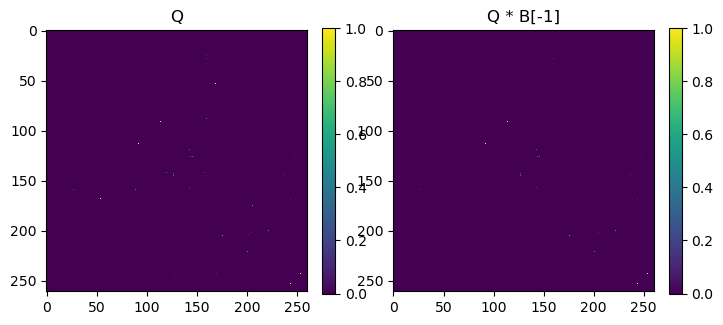

In [17]:
if flag_anomaly:
    mask_tmp = np.zeros(B_0[T_f].shape)
    mask_tmp[B_0[T_f] > 0] = 1 
    
    plt.figure(figsize=(8.2,4))
    plt.subplot(1, 2, 1)
    cmap = 'viridis'
    plt.imshow(QIJ_dense, cmap=cmap, interpolation='nearest') 
    plt.colorbar(fraction=0.046)
    plt.title('Q')


    plt.subplot(1, 2, 2) 
    plt.imshow(QIJ_dense*mask_tmp, cmap=cmap, interpolation='nearest') #values of Q at entries of B
    plt.colorbar(fraction=0.046)
    plt.title('Q * B[-1]') 


    plt.show()

In [18]:
subs_nzp =  B_0[T_f].nonzero()
if T>1:
    if flag_anomaly: 
        M_an = cv.calculate_conditional_expectation_Q(M0[-1], QIJ_dense, beta=beta_an, phi=phi_an, ell=ell_an)
        M_an[subs_nzp] = (1-QIJ_dense)[subs_nzp] * (1 - beta_an) + QIJ_dense[subs_nzp] * (1 - phi_an)# to calculate AUC
        # M_an = (1-QIJ_dense) * (1 - beta_an) + QIJ_dense * (1 - phi_an)# to calculate AUC
    else:
        M_an = cv.calculate_conditional_expectation(M0, beta=beta) 
        M_an[subs_nzp] = (1 - beta)# to calculate AUC
else:
    if flag_anomaly: 
        M_an = cv.calculate_conditional_expectation_Q(M0[-1], QIJ_dense, beta=1, phi=1, ell=float(ell_an)) 
    else:
        M_an = np.copy(M0)


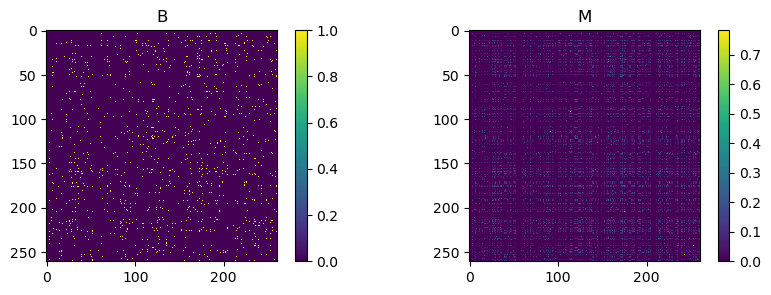

In [19]:
plt.figure(figsize=(10,3))
plt.subplot(1, 2, 1)
plt.imshow(B_0[T_f], cmap=cmap, interpolation='nearest')
# plt.imshow(B[0], cmap=cmap, interpolation='nearest')
plt.colorbar(fraction=0.046)
plt.title('B')


plt.subplot(1, 2, 2) 
plt.imshow(M_an, cmap=cmap, interpolation='nearest') #values of Q at entries of B
plt.colorbar(fraction=0.046)
plt.title('M') 

plt.show()

In [20]:
M_an = (1-QIJ_dense) * (1 - beta_an) + QIJ_dense * (1 - phi_an)# to calculate AUC
cv.calculate_AUC(M_an, B_0[T_f])

0.8327883643871512

In [21]:
B_aggre = B_0.sum(axis=0)

0.005


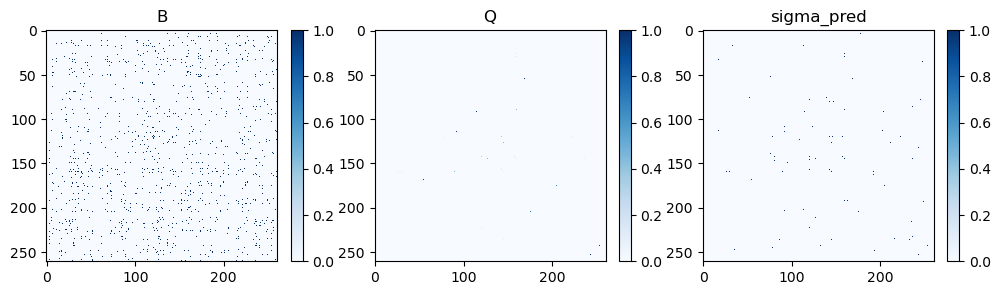

In [22]:
cmap = 'Blues'
mask_tmp = np.zeros(B_aggre.shape)
mask_tmp[B_aggre > 0] = 1  

# threshold = np.max(QIJ_dense*mask_tmp) * 0.1
threshold = np.max(QIJ_dense*mask_tmp) * 0.005
print(threshold)

z_pred = np.copy(QIJ_dense*mask_tmp)
# z_pred = np.copy(QIJ_dense)
if threshold > 0:
    z_pred[z_pred<threshold] = 0
    z_pred[z_pred>=threshold] = 1

plt.figure(figsize=(12,3))
plt.subplot(1, 3, 1)
plt.imshow(B_0[T_f], cmap=cmap, interpolation='nearest') 
plt.colorbar(fraction=0.046)
plt.title('B')


plt.subplot(1, 3, 2)
plt.imshow(QIJ_dense*mask_tmp, cmap=cmap, interpolation='nearest') #values of Q at entries of B
plt.colorbar(fraction=0.046)
plt.title('Q')

plt.subplot(1, 3, 3)
plt.imshow(z_pred, cmap=cmap, interpolation='nearest') #values of Q at entries of B above a threshold 
plt.colorbar(fraction=0.046)
plt.title('sigma_pred')


plt.show()

### Plot communities

In [23]:
nodeName2Id = {n:i for i,n in enumerate(A_0[0].nodes())}
nodeId2Name = {i:n for i,n in enumerate(A_0[0].nodes())}

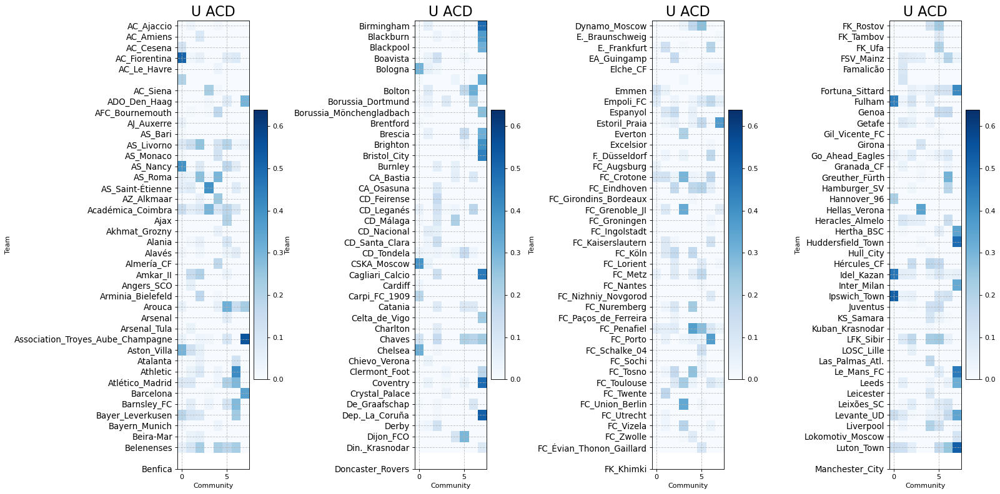

In [24]:
L = 4
alpha = 0.8
lw = 10

umax = u_an.max()
mask = df_meta.node.isin(A_0[0].nodes())

n_max = 40
plt.figure(figsize=(20,10), dpi= 80)

plt.subplot(1,L,1)

node_order = np.array([nodeName2Id[n] for n in df_meta[mask].node.iloc[:n_max]])

plt.imshow(u_an[node_order], cmap = cmap, aspect='auto',vmax = umax)
plt.yticks(df_meta[mask].index[:n_max],df_meta[mask].node.iloc[:n_max], fontsize=10)
plt.colorbar()
plt.title('u ACD')

plt.gca().set(ylabel='Team', xlabel='Community')
plt.yticks(df_meta[mask].index[:n_max], df_meta[mask].node.iloc[:n_max], fontsize=12)
plt.title('U ACD', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)


plt.subplot(1,L,2)

n_2 = 40
node_order = np.array([nodeName2Id[n] for n in df_meta[mask].node.iloc[n_2:n_2+n_max]])

plt.imshow(u_an[node_order], cmap = cmap, aspect='auto',vmax = umax)
plt.yticks(df_meta[mask].index[:n_max],df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=10)
plt.colorbar()
plt.title('u ACD')

# Decorations
plt.gca().set(ylabel='Team', xlabel='Community')
plt.yticks(df_meta[mask].index[:n_max], df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=12)
plt.title('U ACD', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)

plt.subplot(1,L,3)

n_2 = 80
node_order = np.array([nodeName2Id[n] for n in df_meta[mask].node.iloc[n_2:n_2+n_max]])

plt.imshow(u_an[node_order], cmap = cmap, aspect='auto',vmax = umax)
plt.yticks(df_meta[mask].index[:n_max],df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=10)
plt.colorbar()
plt.title('u ACD')

# Decorations
plt.gca().set(ylabel='Team', xlabel='Community')
plt.yticks(df_meta[mask].index[:n_max], df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=12)
plt.title('U ACD', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)

plt.subplot(1,L,4)

n_2 = 120
node_order = np.array([nodeName2Id[n] for n in df_meta[mask].node.iloc[n_2:n_2+n_max]])

plt.imshow(u_an[node_order], cmap = cmap, aspect='auto',vmax = umax)
plt.yticks(df_meta[mask].index[:n_max],df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=10)
plt.colorbar()
plt.title('u ACD')

plt.gca().set(ylabel='Team', xlabel='Community')
plt.yticks(df_meta[mask].index[:n_max], df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=12)
plt.title('U ACD', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)



plt.tight_layout()
plt.show()


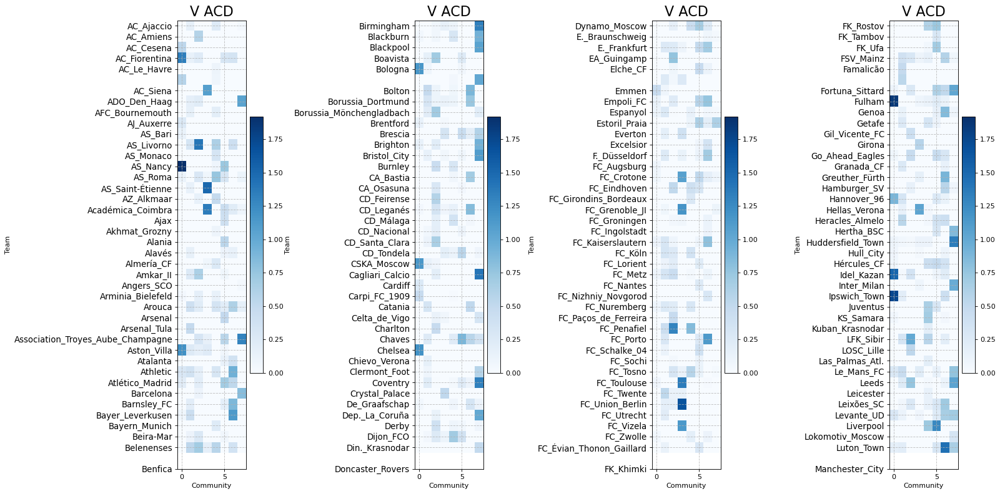

In [25]:
# Draw Plot
L = 4
alpha = 0.8
lw = 10

umax = v_an.max()
mask = df_meta.node.isin(A_0[0].nodes())

n_max = 40
plt.figure(figsize=(20,10), dpi= 80)

plt.subplot(1,L,1)

node_order = np.array([nodeName2Id[n] for n in df_meta[mask].node.iloc[:n_max]])

plt.imshow(v_an[node_order], cmap = cmap, aspect='auto',vmax = umax)
plt.yticks(df_meta[mask].index[:n_max],df_meta[mask].node.iloc[:n_max], fontsize=10)
plt.colorbar()
plt.title('V ACD')

# Decorations
plt.gca().set(ylabel='Team', xlabel='Community')
plt.yticks(df_meta[mask].index[:n_max], df_meta[mask].node.iloc[:n_max], fontsize=12)
plt.title('V ACD', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)


plt.subplot(1,L,2)

n_2 = 40
node_order = np.array([nodeName2Id[n] for n in df_meta[mask].node.iloc[n_2:n_2+n_max]])

plt.imshow(v_an[node_order], cmap = cmap, aspect='auto',vmax = umax)
plt.yticks(df_meta[mask].index[:n_max],df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=10)
plt.colorbar()
plt.title('V ACD')

# Decorations
plt.gca().set(ylabel='Team', xlabel='Community')
plt.yticks(df_meta[mask].index[:n_max], df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=12)
plt.title('V ACD', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)

plt.subplot(1,L,3)

n_2 = 80
node_order = np.array([nodeName2Id[n] for n in df_meta[mask].node.iloc[n_2:n_2+n_max]])

plt.imshow(v_an[node_order], cmap = cmap, aspect='auto',vmax = umax)
plt.yticks(df_meta[mask].index[:n_max],df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=10)
plt.colorbar()
plt.title('V ACD')

# Decorations
plt.gca().set(ylabel='Team', xlabel='Community')
plt.yticks(df_meta[mask].index[:n_max], df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=12)
plt.title('V ACD', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)

plt.subplot(1,L,4)

n_2 = 120
node_order = np.array([nodeName2Id[n] for n in df_meta[mask].node.iloc[n_2:n_2+n_max]])

plt.imshow(v_an[node_order], cmap = cmap, aspect='auto',vmax = umax)
plt.yticks(df_meta[mask].index[:n_max],df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=10)
plt.colorbar()
plt.title('V ACD')

# Decorations
plt.gca().set(ylabel='Team', xlabel='Community')
plt.yticks(df_meta[mask].index[:n_max], df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=12)
plt.title('V ACD', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)



plt.tight_layout()
plt.show()


### Sorting by u or v

In [26]:
from itertools import product

In [27]:
n_cols = 4
n_rows = 2
assert n_rows * n_cols == u_an.shape[1]

### Add the countries name to the dataset

In [28]:
clubs_and_countries = pd.read_csv('../data/input/real_data/transfermarket/clubs_and_countries.csv')
clubs_and_countries.head(n=2)

,club,country
0,Hamburger_SV,Germany
1,FC_Schalke_04,Germany


In [29]:
df_meta.head(n=2)

,node,fee_spent,fee_received,spent_over_received,team_city,coordinates,lat,lon
0,AC_Ajaccio,32.0,16.0,2.000000,Ajaccio,"[41.9195, 8.7382]",41.9195,8.7382
1,AC_Amiens,41.0,54.0,0.759259,Amiens,"[49.8941, 2.3028]",49.8941,2.3028


In [30]:
merged_df = df_meta.merge(clubs_and_countries,left_on='node', right_on='club', how='left')
merged_df = merged_df.drop(columns=['club']).rename(columns={'country': 'club_country'}) 
merged_df['node'].dropna(inplace=True)
merged_df.head(n=-6)

,node,fee_spent,fee_received,spent_over_received,team_city,coordinates,lat,lon,club_country
0,AC_Ajaccio,32.0,16.0,2.000000,Ajaccio,"[41.9195, 8.7382]",41.9195,8.7382,France
1,AC_Amiens,41.0,54.0,0.759259,Amiens,"[49.8941, 2.3028]",49.8941,2.3028,France
2,AC_Cesena,43.0,70.0,0.614286,Cesena,"[44.1391, 12.2436]",44.1391,12.2436,Italy
3,AC_Fiorentina,575.0,544.0,1.056985,Florence,"[43.7696, 11.2558]",43.7696,11.2558,Italy
4,AC_Le_Havre,6.0,72.0,0.083333,Le Havre,"[49.4944, 0.107]",49.4944,0.1070,France
...,...,...,...,...,...,...,...,...,...
280,Vitória_Setúbal_FC,106.0,24.0,4.416667,Setúbal,"[38.5266, -8.8893]",38.5266,-8.8893,Portugal
281,Watford_FC,403.0,259.0,1.555985,Watford,"[51.6565, -0.3903]",51.6565,-0.3903,England
282,Werder_Bremen,187.0,197.0,0.949239,Bremen,"[53.0793, 8.8017]",53.0793,8.8017,Germany
283,West_Brom,321.0,137.0,2.343066,West Bromwich,"[52.5152, -1.9635]",52.5152,-1.9635,England


In [31]:
merged_df = merged_df.dropna(subset=['node'])
merged_df = merged_df.reset_index(drop=True) 
merged_df.head(n=2)

,node,fee_spent,fee_received,spent_over_received,team_city,coordinates,lat,lon,club_country
0,AC_Ajaccio,32.0,16.0,2.000000,Ajaccio,"[41.9195, 8.7382]",41.9195,8.7382,France
1,AC_Amiens,41.0,54.0,0.759259,Amiens,"[49.8941, 2.3028]",49.8941,2.3028,France


### assign colors to countries

In [32]:
colors_country = ['#1f77b4', '#ff7f0e', '#2ca02c', '#7f7f7f', '#9467bd', '#8c564b', '#e377c2', '#d62728' ]
colors_country = ['blue', 'orange', 'green', 'Purple', 'grey', 'brown', 'pink', 'red' ]

In [33]:
merged_df['club_country'].head(n=-6)

0        France
1        France
2         Italy
3         Italy
4        France
         ...   
278    Portugal
279     England
280     Germany
281     England
282     England
Name: club_country, Length: 283, dtype: object

In [34]:
unique_countries = sorted(merged_df['club_country'].dropna().unique())
country_color_map = {country: colors_country[idx] for idx, country in enumerate(unique_countries)}
for country in unique_countries:
    print(f"{country}: {country_color_map[country]}")

England: blue
France: orange
Germany: green
Italy: Purple
Netherlands: grey
Portugal: brown
Russia: pink
Spain: red


In [35]:
unique_countries = sorted(unique_countries, reverse=True)
unique_countries

['Spain',
 'Russia',
 'Portugal',
 'Netherlands',
 'Italy',
 'Germany',
 'France',
 'England']

In [36]:
sns_setting = True

In [37]:
if sns_setting:   
    sns.set_theme() 
    sns.set_theme(style="darkgrid", palette="pastel") 
    custom_params = {"axes.spines.right": False, "axes.spines.top": False}
    sns.set_theme(style="darkgrid", rc=custom_params, font_scale=0.1, palette="tab20")  

    sns.set_context("paper")# Option: "paper","notebook","talk","poster",the later the bigger.
    sns.set_theme(style="ticks", rc={"font.size": 7, "font.family": ['Helvetica']}) 
cmap = 'copper'  

In [38]:
params = {'legend.fontsize': 'x-small',
          'figure.figsize': (9,10),
         'axes.labelsize': 'xx-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'medium', 
         'ytick.labelsize':'x-small'}
pylab.rcParams.update(params)#medium

In [39]:
country_color_map['England'] = 'Red'
country_color_map['Spain'] = 'dimgray'
country_color_map['Italy'] = 'forestgreen'
country_color_map['France'] = 'darkorange'
country_color_map['Germany'] =  'indigo' #'darkviolet'
country_color_map['Portugal'] = 'hotpink'
country_color_map['Russia'] = 'darkcyan'
country_color_map['Netherlands'] = 'cornflowerblue'

In [40]:
country_color_map.values()

dict_values(['Red', 'darkorange', 'indigo', 'forestgreen', 'cornflowerblue', 'hotpink', 'darkcyan', 'dimgray'])

/var/folders/pw/4dwsg8dx0vq6f1n_mw1wstvh0000gn/T/ipykernel_45516/978456068.py:57: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


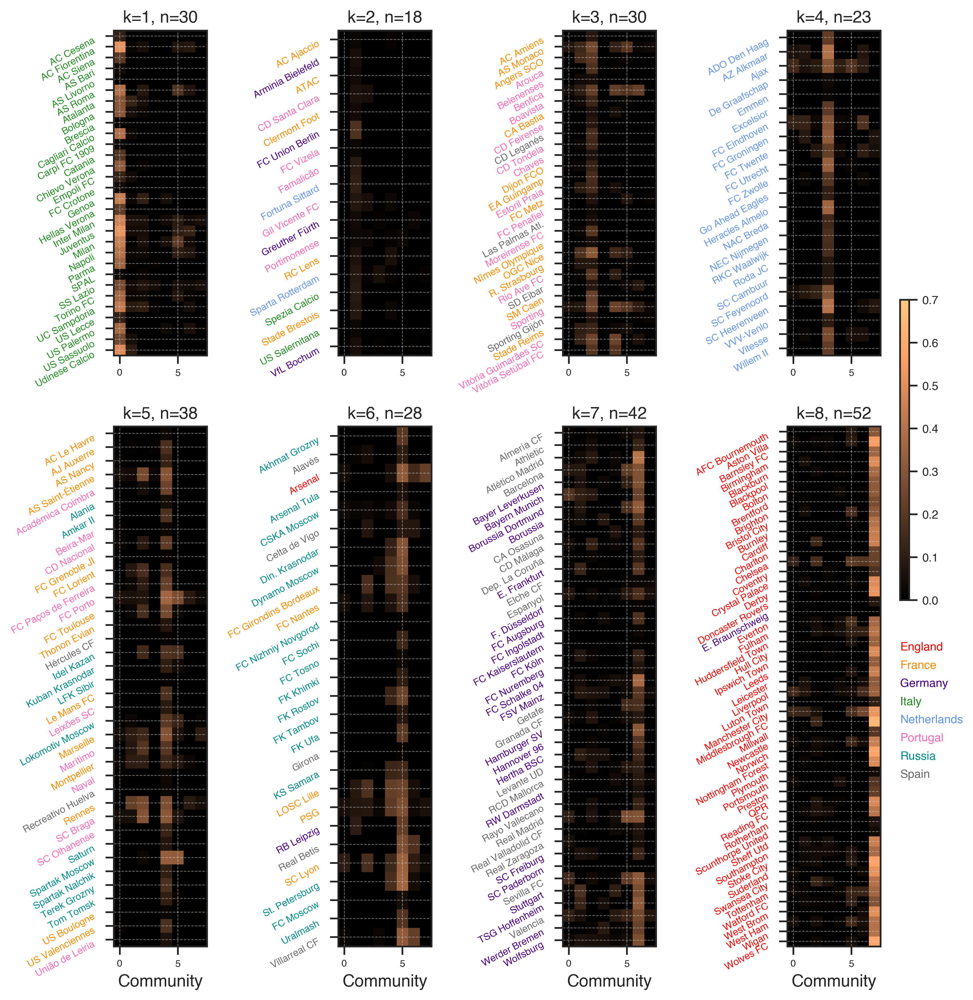

In [41]:
height_ratios = [1, 1.6] 
L = u_an.shape[1]
alpha = 0.6
lw = 5

umax = u_an.max()

fig, axs = plt.subplots(n_rows, n_cols, figsize=params['figure.figsize'], dpi=350, gridspec_kw={'height_ratios': height_ratios})
z = 0
for k, (r, c) in enumerate(product(np.arange(n_rows), np.arange(n_cols))):
    plt.subplot(n_rows, n_cols, k + 1)

    selected_node_ids = np.where(np.argmax(u_an, axis=1) == k)[0]
    selected_node_names = [nodeId2Name[i] for i in selected_node_ids]
    mask = merged_df.node.isin(selected_node_names)
    n = np.sum(mask)
    yticks = np.arange(n)
    
    for i, country in enumerate(merged_df[mask].club_country):
        color = country_color_map.get(country, 'black')  # default color is black if not found in the map   
        node_name = merged_df[mask].node.iloc[i].replace('_', ' ')
        if node_name == 'Association Troyes Aube Champagne':
            node_name = 'ATAC' 
        if node_name == 'Borussia Mönchengladbach':
            node_name = 'Borussia'
        if node_name == 'SC Cambuur Leeuwarden':
            node_name = 'SC Cambuur'
        if node_name == 'Torpedo-Metallurg Moscow':
            node_name = 'FC Moscow'
        if node_name == 'FC Évian Thonon Gaillard':
            node_name = 'Thonon Evian'
        plt.text(L - 10, i, node_name, color=color, fontdict={'size': params['xtick.labelsize']}, ha='right', va='top', rotation=28)
    

    node_order = np.array([nodeName2Id[n] for n in merged_df[mask].node]) 
    plt.imshow(u_an[node_order], cmap = cmap, aspect='auto',vmax = max(umax,0.7)) 
    plt.yticks(yticks, [], fontsize=0.5, weight='normal') 
    plt.grid(linestyle='--', alpha=alpha, linewidth = 0.5) 

    plt.title(f'k={k+1}, n={n}', fontdict={'size': params['axes.labelsize'], 'weight': 'bold'})
    
    
    if r == 1:   
        plt.gca().set(ylabel= ' ', xlabel='Community') 
    else:
        plt.gca().set(ylabel=' ')

plt.subplots_adjust(wspace=0.3, hspace=0.001) 
cbar = plt.colorbar(cax=plt.axes([1.01, 0.4, 0.01, 0.3])) 
cbar.ax.tick_params(labelsize='large') 

# Plot country names under the color bar
for i, (country, color) in enumerate(zip(unique_countries, country_color_map.values())): 
    color = country_color_map.get(country, 'black')
    plt.text(1.01, 0.22 + i/55, country, color=color, fontdict={'size': 'large', 'weight': 'extra bold'}, ha='left', va='bottom', transform=fig.transFigure)

plt.tight_layout()
plt.show()

In [42]:
importlib.reload(tlm)

<module 'tools_temp' from '/Users/hasafdari/Downloads/WORK/GitHub/DynACD/code/tools_temp.py'>

/var/folders/pw/4dwsg8dx0vq6f1n_mw1wstvh0000gn/T/ipykernel_45516/1173772136.py:57: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


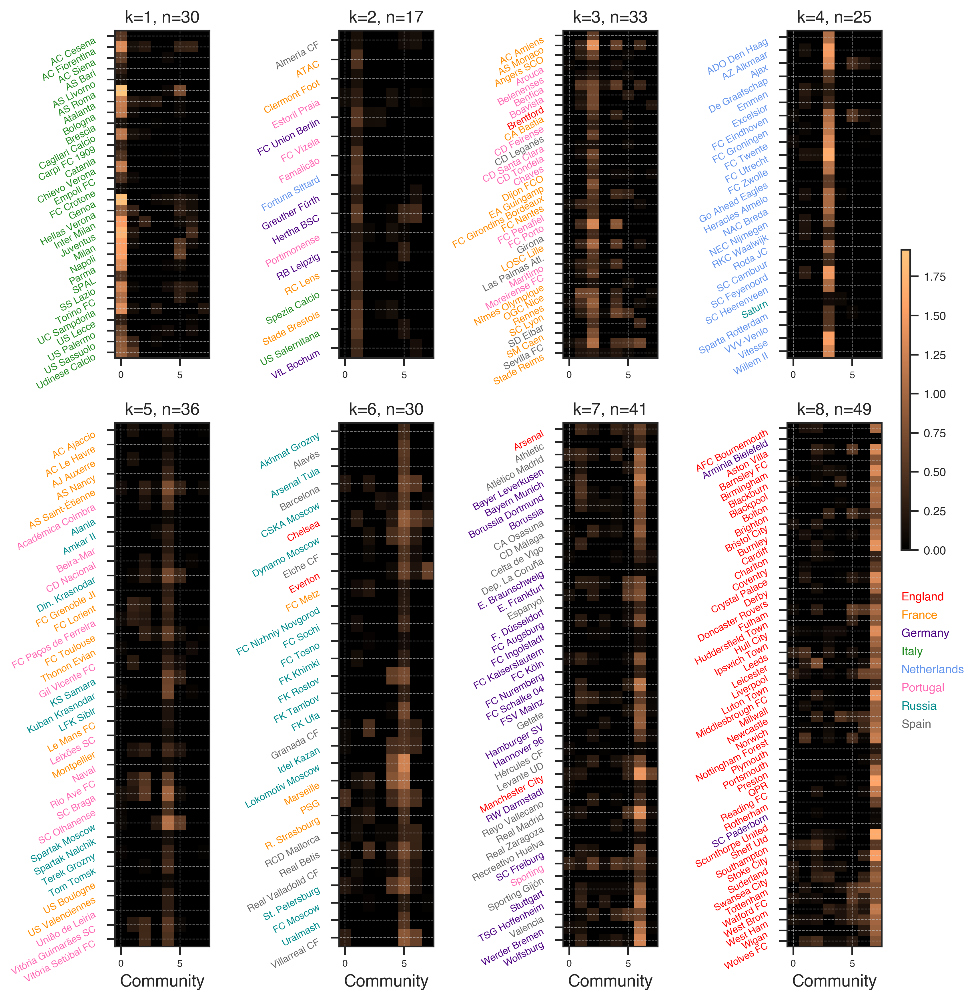

In [43]:
height_ratios = [1, 1.6]
L = v_an.shape[1]
alpha = 0.6
lw = 5
umax = v_an.max()

fig, axs = plt.subplots(n_rows, n_cols, figsize=params['figure.figsize'], dpi=350, gridspec_kw={'height_ratios': height_ratios})
z = 0
for k, (r, c) in enumerate(product(np.arange(n_rows), np.arange(n_cols))):
    plt.subplot(n_rows, n_cols, k + 1)

    selected_node_ids = np.where(np.argmax(v_an, axis=1) == k)[0]
    selected_node_names = [nodeId2Name[i] for i in selected_node_ids]
    mask = merged_df.node.isin(selected_node_names)
    n = np.sum(mask)
    yticks = np.arange(n)
    
    for i, country in enumerate(merged_df[mask].club_country):
        color = country_color_map.get(country, 'black')  # default color is black if not found in the map 
        node_name = merged_df[mask].node.iloc[i].replace('_', ' ')
        if node_name == 'Association Troyes Aube Champagne':
            node_name = 'ATAC' 
        if node_name == 'Borussia Mönchengladbach':
            node_name = 'Borussia'
        if node_name == 'SC Cambuur Leeuwarden':
            node_name = 'SC Cambuur'
        if node_name == 'Torpedo-Metallurg Moscow':
            node_name = 'FC Moscow'
        if node_name == 'FC Évian Thonon Gaillard':
            node_name = 'Thonon Evian'
        plt.text(L - 10, i, node_name, color=color, fontdict={'size': params['xtick.labelsize']}, ha='right', va='top', rotation=28)
    

    node_order = np.array([nodeName2Id[n] for n in merged_df[mask].node]) 
    plt.imshow(v_an[node_order], cmap = cmap, aspect='auto',vmax = max(umax,0)) 
    plt.yticks(yticks, [], fontsize=0.5, weight='normal') 
    plt.grid(linestyle='--', alpha=alpha, linewidth = 0.5) 

    plt.title(f'k={k+1}, n={n}', fontdict={'size': params['axes.labelsize'], 'weight': 'bold'})
    
    
    if r == 1: 
        plt.gca().set(ylabel= ' ', xlabel='Community') 
    else:
        plt.gca().set(ylabel=' ')

plt.subplots_adjust(wspace=0.4, hspace=0.001) 
cbar = plt.colorbar(cax=plt.axes([1.01, 0.45, 0.01, 0.3]))
cbar.ax.tick_params(labelsize='large') 


# Plot country names under the color bar
for i, (country, color) in enumerate(zip(unique_countries, country_color_map.values())): 
    color = country_color_map.get(country, 'black')
    plt.text(1.01, 0.27 + i/55, country, color=color, fontdict={'size': 'large', 'weight': 'extra bold'}, ha='left', va='bottom', transform=fig.transFigure)

plt.tight_layout()
plt.show()

### Get `df_anomalies`

In [44]:
B_aggre = B_0.sum(axis=0)
mask_tmp = np.zeros(B_aggre.shape)
mask_tmp[B_aggre > 0] = 1  

lambda_ij = cv._lambda0_full(u_an, v_an, w_an).mean(axis=0)

index_to_name = {node_idx: node_name for node_idx, node_name in enumerate(A_0[0].nodes())}

df_anomalies = ttl.get_df_anomalies(QIJ_dense,index_to_name, mask=mask_tmp, df_meta=df_meta,lambdaIJ=lambda_ij)
# df_anomalies.head(n=30)
df_anomalies.sort_values(by=['Q_ij','lambda_ij'],ascending=[False,False]).head(n=30)

,ego_id,alter_id,Q_ij,ego_name,alter_name,lambda_ij,ego_fee_received,alter_fee_received,ego_fee_spent,alter_fee_spent
0,168,54,1.000000,NEC_Nijmegen,CA_Osasuna,0.000000,26.0,62.0,65.0,68.0
1,54,168,1.000000,CA_Osasuna,NEC_Nijmegen,0.000000,62.0,26.0,68.0,65.0
2,243,253,1.000000,Udinese_Calcio,Watford_FC,0.048507,588.0,259.0,389.0,403.0
3,253,243,1.000000,Watford_FC,Udinese_Calcio,0.013027,259.0,588.0,403.0,389.0
4,114,92,0.999834,FC_Union_Berlin,FC_Augsburg,0.028074,70.0,91.0,68.0,159.0
5,92,114,0.999834,FC_Augsburg,FC_Union_Berlin,0.012970,91.0,70.0,159.0,68.0
6,175,205,0.666555,OGC_Nice,SC_Lyon,0.175582,292.0,772.0,342.0,566.0
7,205,175,0.666555,SC_Lyon,OGC_Nice,0.066926,772.0,292.0,566.0,342.0
9,221,200,0.554147,Sporting,SC_Braga,0.181921,570.0,315.0,353.0,132.0
8,200,221,0.554147,SC_Braga,Sporting,0.160200,315.0,570.0,132.0,353.0


### Plot subgraph with italian teams, they are the most involved in anomalous edges

In [45]:
def get_subgraph_from_nodelist(G: nx.Graph,nodelist: list, edge_direction: str = 'both') -> nx.Graph:
    '''
    Get a subgraph containing all the nodes in nodelist but ALSO nodes connected to them who are not in nodelist
    networkx default G.subgraph() excludes these boundary nodes
    '''
    if edge_direction == 'both':
        selected_edges = set(list(G.out_edges(nodelist)) + list(G.in_edges(nodelist)))
    elif edge_direction == 'in':
        selected_edges = set(list(G.in_edges(nodelist)))
    elif edge_direction == 'out':
        selected_edges = set(list(G.out_edges(nodelist)))
        
    H = G.__class__()
    H.add_nodes_from(nodelist)
    H.add_edges_from(selected_edges)
    
    return H
    

In [46]:
def plot_subgraph(
    G: nx.Graph,
    G0: nx.Graph,
    nodeName2Id: dict,
    df_anomalies: pd.DataFrame,
    membership: np.ndarray,
    pos: dict = None,
    scale: float = 1.5,
    font_size: float = 10,
    threshold_Qij: float = 0.5,
    node_size_factor: float = 0.01,
    offset_edge_width: int = 1,
    color_regular: str = 'silver',
    color_anomaly: str = 'r',
    ax: plt.Axes = None,
    padding: float = 0.1, 
    target_nodes: list =['Genoa', 'Juventus'],
    **kw_args
):
    if pos is None:
        pos = nx.circular_layout(G,scale=scale, center=[0, 0.5])  

    # Set 'Genoa' to the center
    if 'Genoa' in pos:
        center_position = np.array([0, 0.5])  # Adjust as needed
        pos['Genoa'] = center_position
    
    x_values = [coord[0] for coord in pos.values()]
    y_values = [coord[1] for coord in pos.values()] 

    ax.set_xlim(min(x_values) - padding, max(x_values) + padding)
    
    
    sorted_id = [nodeName2Id[n] for n in G.nodes()]
    U = membership[sorted_id]
    node_size = np.array([G0.in_degree[i] for i in G.nodes()]) + 0.1
    node_size = np.ones(len(G))

    edge_width = [offset_edge_width+1.5*ttl.get_Qij_from_df_anomalies(df_anomalies,i=e[0],j=e[1]) for e in G.edges()]
    edge_color = [color_regular if edge_width[i]-offset_edge_width < threshold_Qij else color_anomaly for i in range(len(edge_width))] 
    config = {'node_size':node_size,'node_size_factor': node_size_factor,'edge_width':edge_width,'edge_color':edge_color,'ax':ax, 'font_size':font_size, 'target_nodes':target_nodes}
    
    ttl.plotting_map(G,pos,U=U, **config)

In [47]:
beta_an,phi_an,ell_an

(array([0.80845643]), array(0.21706823), array(0.57637222))

### Plot Genoa/Juventus and its connections

In [79]:
sns.reset_defaults()

In [80]:
import seaborn as sns 
sns.set_theme()
sns.set_theme(style="ticks", rc={ "font.family": ['Helvetica']}) 

In [99]:
if sns_setting:   
    sns.set_theme() 
    sns.set_theme(style="darkgrid", palette="pastel") 
    custom_params = {"axes.spines.right": False, "axes.spines.top": False}
    sns.set_theme(style="darkgrid", rc=custom_params, font_scale=0.1, palette="tab20")  

    sns.set_context("paper")# Option: "paper","notebook","talk","poster",the later the bigger.
    sns.set_theme(style="ticks", rc={"font.size": 1, "font.family": ['Helvetica']}) 
    cmap = 'copper'


params = {'legend.fontsize': 'xx-small', 
         'axes.labelsize': 'xx-small',
         'axes.titlesize':'xx-small',
         'xtick.labelsize':'xx-small',
         'ytick.labelsize':'xx-small'}
pylab.rcParams.update(params)#medium

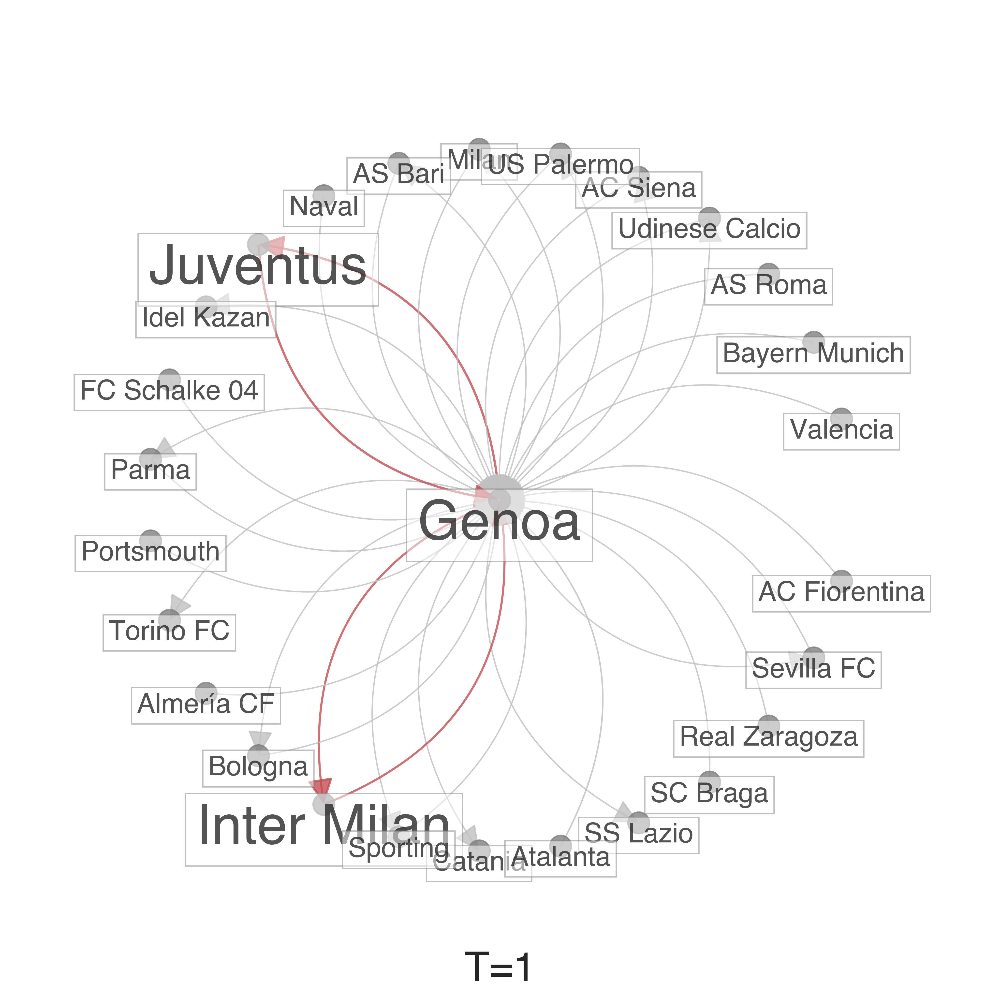

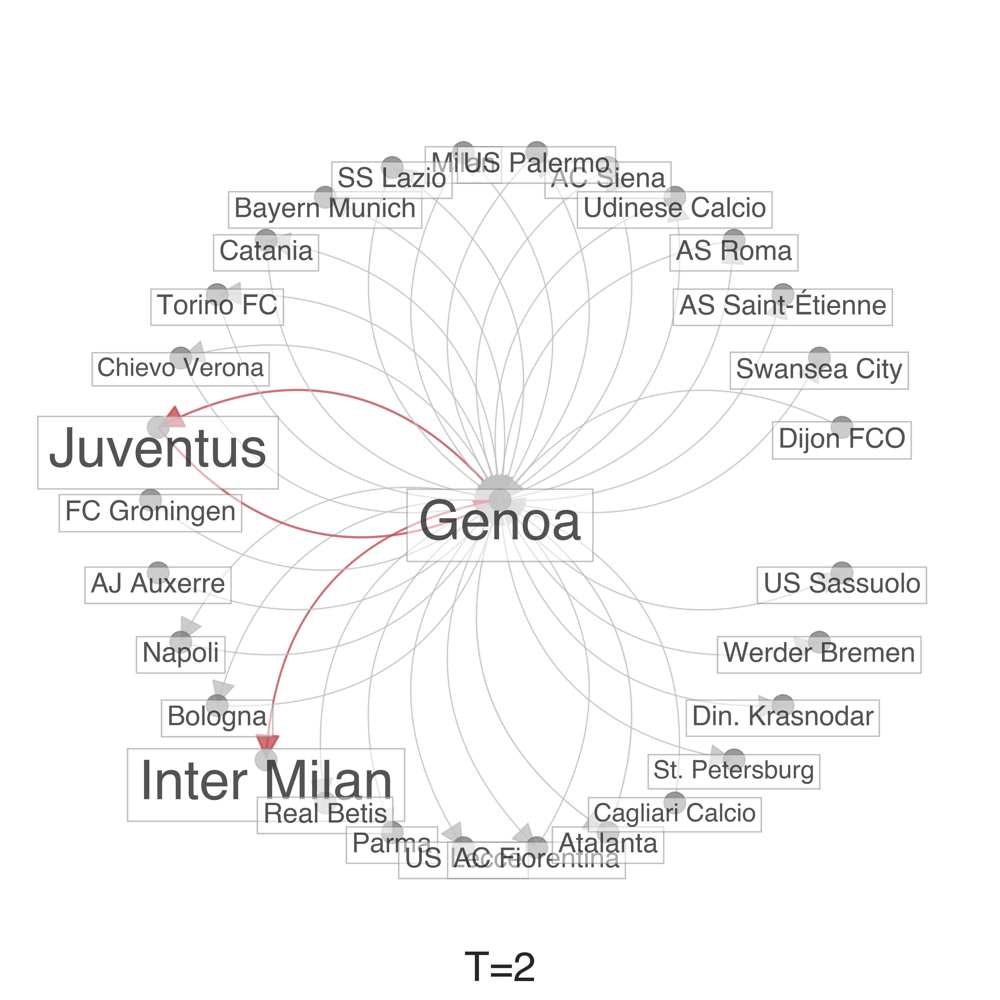

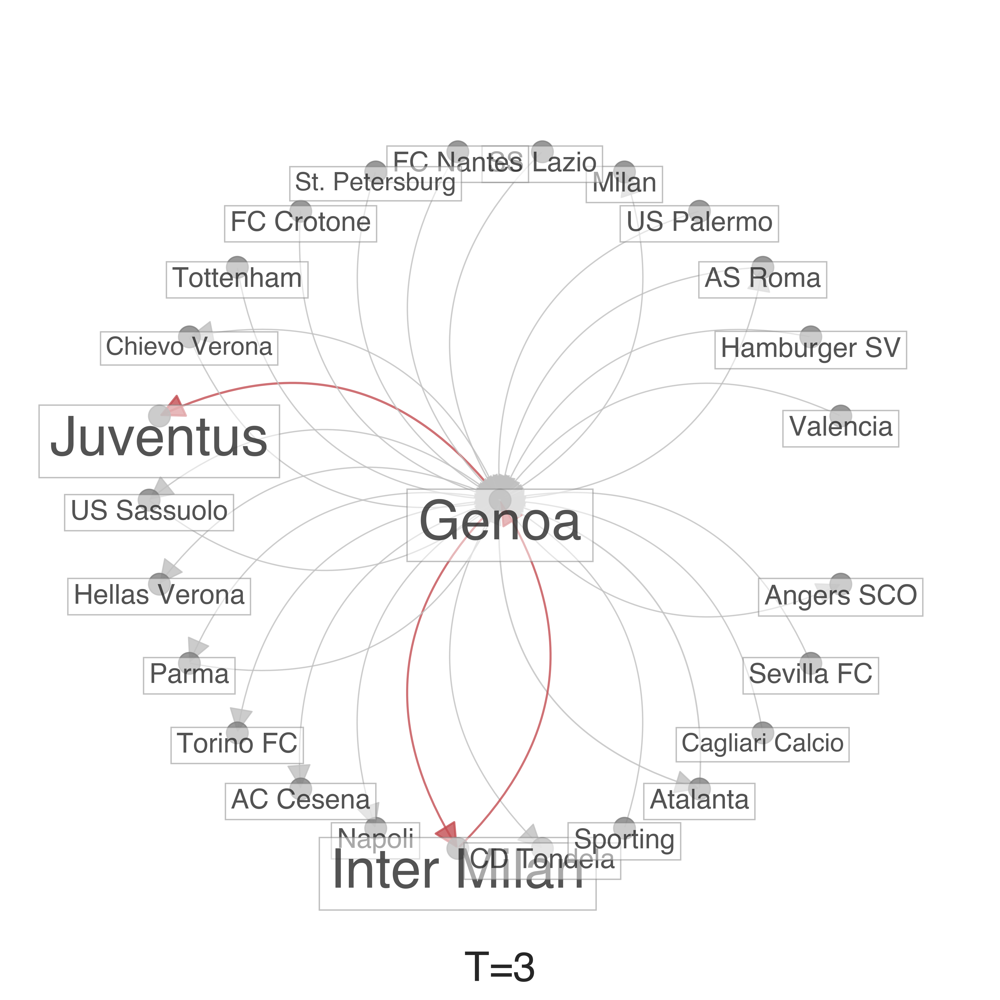

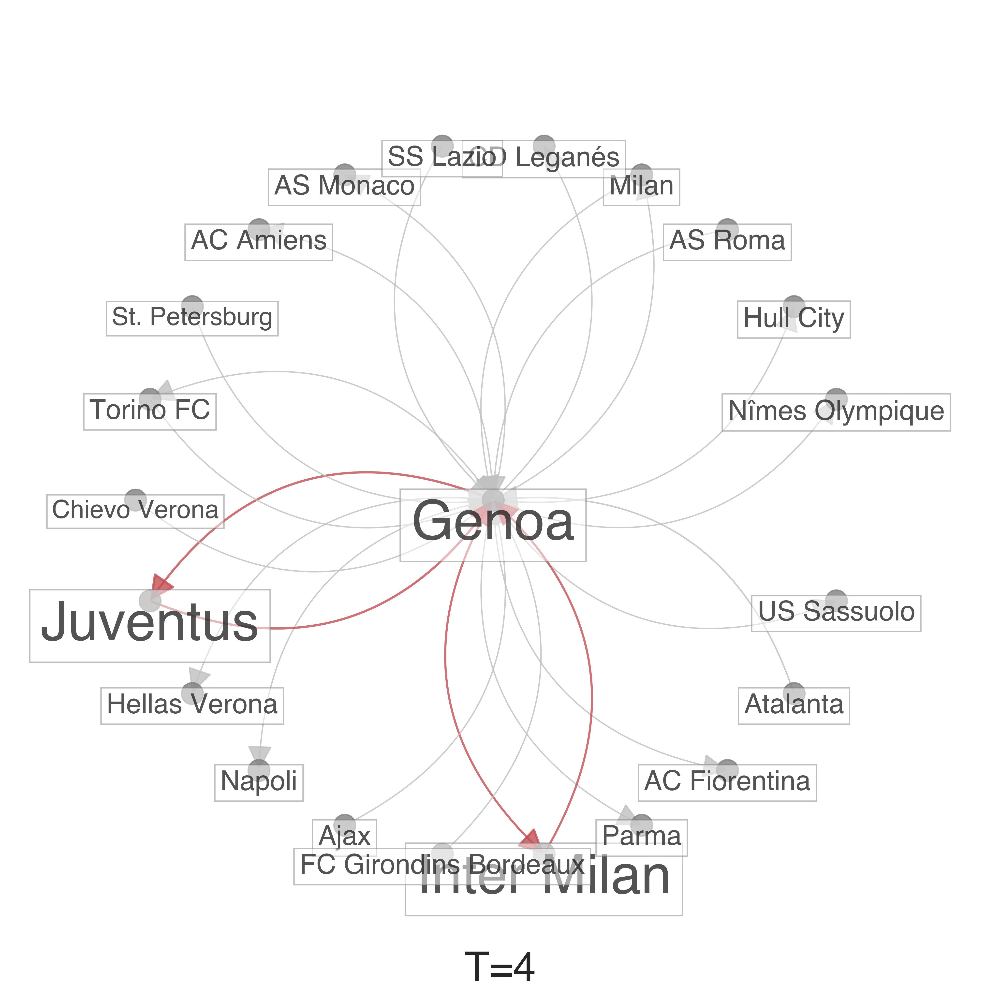

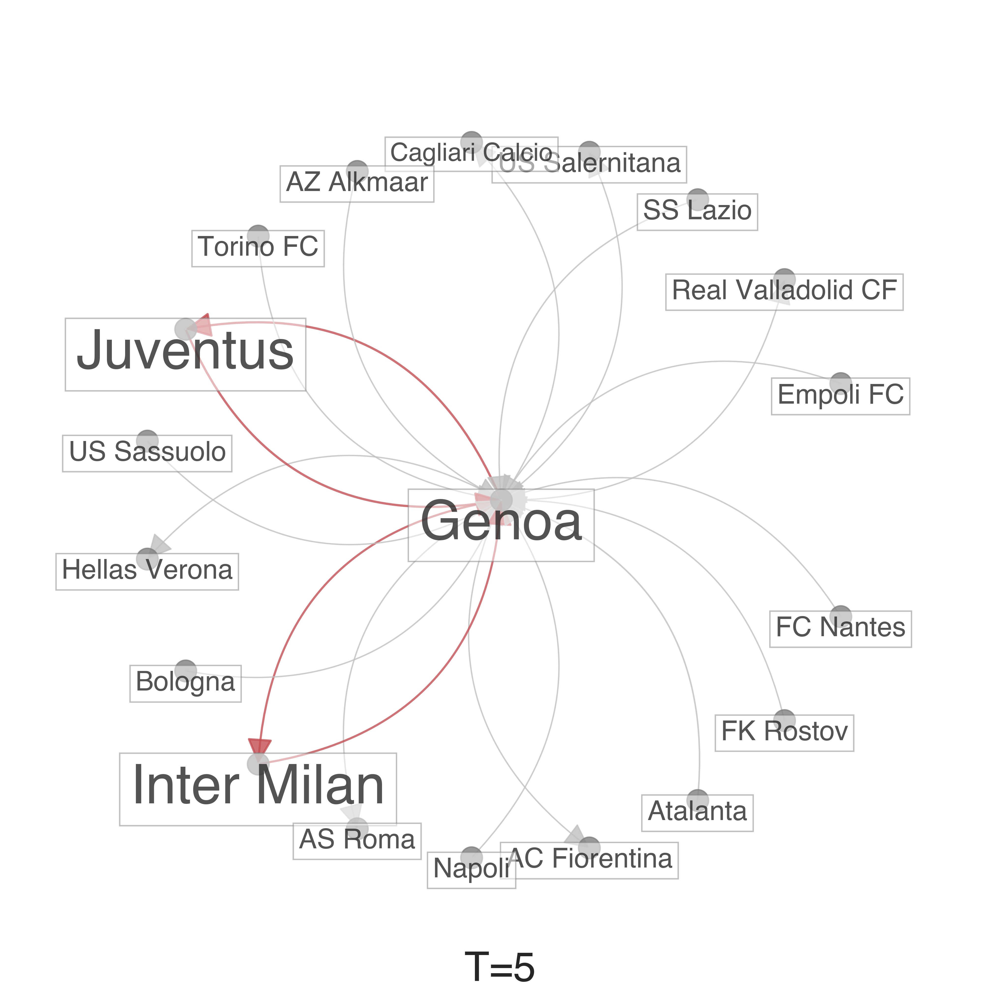

In [100]:
for tid in range(len(A_0)):
    k = 6
    selected_node_ids = np.where(np.argmax(v_an, axis=1) == k)[0]
    selected_node_names = ['Genoa']  
    G = get_subgraph_from_nodelist(A_0[tid], selected_node_names, edge_direction='both')
    
    fig_single, ax_single = plt.subplots(figsize=(10, 10), dpi=400)

    plot_subgraph(G, A_0[tid], nodeName2Id, df_anomalies, u_an, ax=ax_single, scale=4, threshold_Qij=0.2, node_size_factor=0.001, font_size=20, offset_edge_width=1, padding= - 1, target_nodes=['Inter_Milan','Inter Milan','Genoa', 'Juventus'])
     
    ax_single.set_title(f"T={tid+1}", fontsize=30, fontweight='bold', y=0.001)
    plt.show()
    plt.close(fig_single)

In [101]:
plt.close()

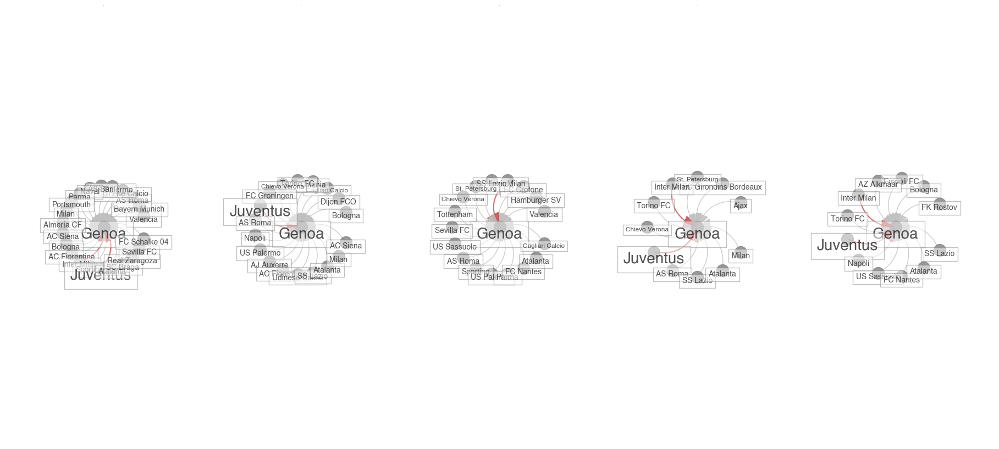

In [102]:
fig,ax = plt.subplots(1,len(A_0),figsize=(18,8))

for tid in range(len(A_0)):
    selected_node_names = ['Genoa']
    G = get_subgraph_from_nodelist(A_0[tid],selected_node_names,edge_direction='in')
    plot_subgraph(G,A_0[tid],nodeName2Id,df_anomalies,u_an,ax=ax[tid],scale=2,threshold_Qij=0.2)
    ax[tid].set_title(f"t={tid}")

plt.show()

In [103]:
plt.close('all')

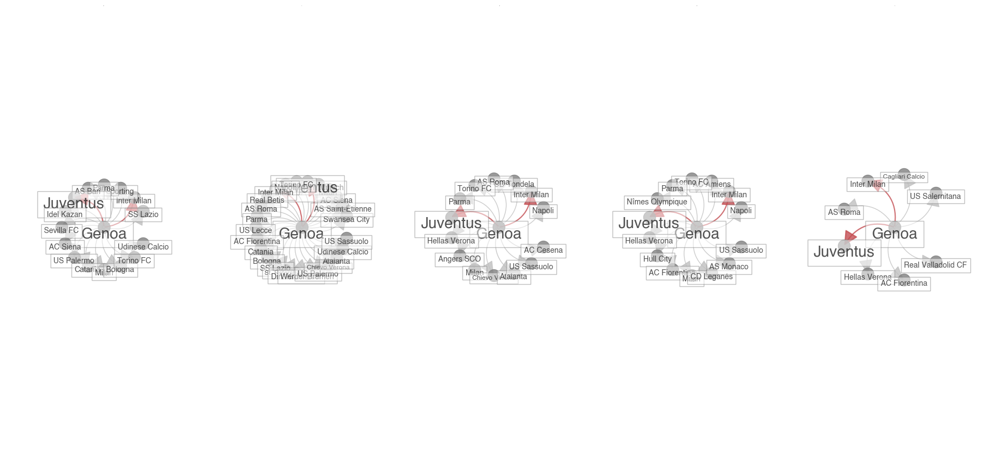

In [104]:
fig, ax = plt.subplots(1, len(A_0), figsize=(18, 8))
for tid in range(len(A_0)): 
    k = 6
    selected_node_ids = np.where(np.argmax(v_an, axis=1) == k)[0]
    selected_node_names = [nodeId2Name[i] for i in selected_node_ids]
    selected_node_names = ['Genoa']  
    G = get_subgraph_from_nodelist(A_0[tid], selected_node_names, edge_direction='out')
    plot_subgraph(G, A_0[tid], nodeName2Id, df_anomalies, u_an, ax=ax[tid], scale=2, threshold_Qij=0.2)
    ax[tid].set_title(f"t={tid}")
plt.show()


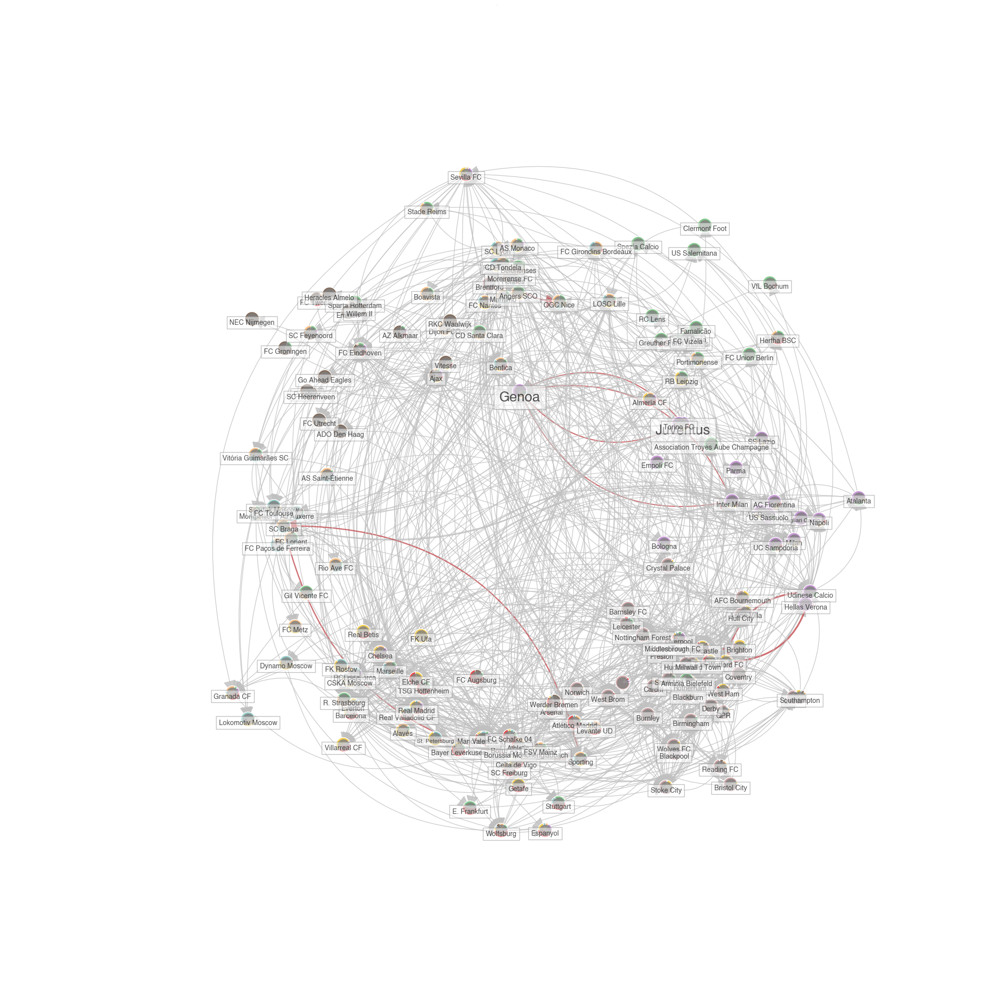

In [105]:
fig,ax = plt.subplots(1,1,figsize=(20,20))
tid = -1

selected_node_names = []
for k in np.arange(v_an.shape[-1]):
    selected_node_ids = np.where(np.argmax(v_an,axis=1) == k)[0]
    selected_node_names.extend([nodeId2Name[i] for i in selected_node_ids])
# selected_node_names = ['Milan']

selected_node_names = [n for n in selected_node_names if ttl.get_transfer(df,source=n).iloc[:,2:].sum(axis=1).sum() > 100]
pos = ttl.assign_pos_based_on_membership(selected_node_names,v_an, nodeName2Id)

G = get_subgraph_from_nodelist(A_0[tid],selected_node_names,edge_direction='both')

pos = ttl.assign_pos_based_on_membership(G.nodes(),v_an, nodeName2Id,delta=0.5)
plot_subgraph(G,A_0[tid],nodeName2Id,df_anomalies,u_an,ax=ax,scale=2,pos=pos,node_size_factor=0.03)
ax.set_title(f"t={tid}")
plt.show()

# Manipulate parameters to check how Q_ij changes

In [70]:
ni = 'Genoa' 

In [71]:
df_anomalies[df_anomalies['ego_name']==ni].sort_values(by=['Q_ij','lambda_ij'],ascending=[False,False]).head(n=5)

,ego_id,alter_id,Q_ij,ego_name,alter_name,lambda_ij,ego_fee_received,alter_fee_received,ego_fee_spent,alter_fee_spent
12,127,145,0.425485,Genoa,Juventus,0.375576,685.0,1083.0,591.0,1755.0
14,127,143,0.356927,Genoa,Inter_Milan,0.340401,685.0,876.0,591.0,1210.0
41,127,30,0.065952,Genoa,Atalanta,0.269262,685.0,518.0,591.0,494.0
60,127,211,0.016424,Genoa,SS_Lazio,0.273149,685.0,308.0,591.0,426.0
88,127,13,0.007168,Genoa,AS_Roma,0.411828,685.0,835.0,591.0,1000.0


In [72]:
nj = 'Parma'

nz = 'Inter_Milan'
i,j = nodeName2Id[ni],nodeName2Id[nj]
z = nodeName2Id[nz]
print(i,j,z)
print(u_an[i])
print(v_an[j])

127 177 143
[4.42560383e-01 2.86814241e-02 1.09847907e-01 0.00000000e+00
 5.68601708e-02 3.77439348e-07 3.96188847e-07 0.00000000e+00]
[1.33966926e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 4.44510184e-02 9.05157159e-02 2.70892221e-08 0.00000000e+00]


In [74]:
flag_exchange_ID = False

In [75]:
B_0_modified = np.copy(B_0[0])
B_train_modified = np.copy(B_train)
u_modified = np.copy(u_an)
v_modified = np.copy(v_an)



if flag_exchange_ID:
    B_train_modified[:,i,j] = B_train_modified[:,z,i]
    B_train_modified[:,j,i] = B_train_modified[:,z,i]
    B_train_modified[-1,i,j] = 1
    B_train_modified[-1,j,i] = 1


    u_modified[z] = np.copy(u_an[j])
    v_modified[z] = np.copy(v_an[j])

M0_modified = cv._lambda0_full(u_modified, v_modified, w_an[1:])
M00_modified = cv._lambda0_full(u_modified, v_modified, (w_an[0])[np.newaxis])
QIJ_dense_modified = cv.QIJ_dense(B_train_modified,(B_0_modified)[np.newaxis,:,:],M0_modified,M00_modified,T_f, beta=beta_an, phi=phi_an, ell=ell_an,pi=pi_an, mu=mu_an,EPS=1e-12) 

In [76]:
B_aggre = B_0.sum(axis=0)
mask_tmp = np.zeros(B_aggre.shape)
mask_tmp[B_aggre > 0] = 1  

lambda_ij = cv._lambda0_full(u_modified, v_modified, w_an).mean(axis=0)

index_to_name = {node_idx: node_name for node_idx, node_name in enumerate(A_0[0].nodes())}

df_anomalies_modified = ttl.get_df_anomalies(QIJ_dense_modified,index_to_name, mask=mask_tmp, df_meta=merged_df,lambdaIJ=lambda_ij)
df_anomalies_modified.head(n=20)
df_anomalies_modified.sort_values(by=['Q_ij','lambda_ij'],ascending=[False,False]).head(n=10)

,ego_id,alter_id,Q_ij,ego_name,alter_name,lambda_ij,ego_fee_received,alter_fee_received,ego_fee_spent,alter_fee_spent
0,168,54,1.000000,NEC_Nijmegen,CA_Osasuna,0.000000,26.0,62.0,65.0,68.0
1,54,168,1.000000,CA_Osasuna,NEC_Nijmegen,0.000000,62.0,26.0,68.0,65.0
2,243,253,1.000000,Udinese_Calcio,Watford_FC,0.048507,588.0,259.0,389.0,403.0
3,253,243,1.000000,Watford_FC,Udinese_Calcio,0.013027,259.0,588.0,403.0,389.0
4,114,92,0.999834,FC_Union_Berlin,FC_Augsburg,0.028074,70.0,91.0,68.0,159.0
5,92,114,0.999834,FC_Augsburg,FC_Union_Berlin,0.012970,91.0,70.0,159.0,68.0
6,175,205,0.666555,OGC_Nice,SC_Lyon,0.175582,292.0,772.0,342.0,566.0
7,205,175,0.666555,SC_Lyon,OGC_Nice,0.066926,772.0,292.0,566.0,342.0
9,221,200,0.554147,Sporting,SC_Braga,0.181921,570.0,315.0,353.0,132.0
8,200,221,0.554147,SC_Braga,Sporting,0.160200,315.0,570.0,132.0,353.0


## Genoa

In [77]:
team_name = 'Genoa'

df_Genoa = ttl.get_transfer(df,source=team_name)
df_Genoa.loc[:,'sum_w'] = df_Genoa.iloc[:,2:].sum(axis=1)
df_Genoa = df_Genoa.merge(df_anomalies[['ego_name','alter_name','Q_ij','lambda_ij']],left_on=['source','target'],right_on=['ego_name','alter_name'],how='inner').drop(columns=['ego_name','alter_name'])
df_Genoa.sort_values(by=['Q_ij','sum_w','source','target'],ascending=[False,False,False,False]).head(n=6)

,source,target,weight_t0,weight_t1,weight_t2,weight_t3,weight_t4,sum_w,Q_ij,lambda_ij
1,Genoa,Juventus,1,1,1,1,1,5,0.425485,0.375576
44,Juventus,Genoa,1,1,0,1,1,4,0.425485,0.482548
0,Genoa,Inter_Milan,1,1,1,1,1,5,0.356927,0.340401
50,Inter_Milan,Genoa,1,0,1,1,1,4,0.356927,0.426958
41,Atalanta,Genoa,1,1,1,1,1,5,0.065952,0.270931
18,Genoa,Atalanta,0,1,1,0,0,2,0.065952,0.269262


## Inter_Milan

In [78]:
team_name = 'Inter_Milan'

df_milan = ttl.get_transfer(df,source=team_name)
df_milan.loc[:,'sum_w'] = df_milan.iloc[:,2:].sum(axis=1)
# df_milan.loc[:,'Q_ij'] = df_milan.apply(lambda x: ttl.get_Qij_from_df_anomalies(df_anomalies,i=x['source'],j=x['target'],axis=0))
df_milan = df_milan.merge(df_anomalies_modified[['ego_name','alter_name','Q_ij','lambda_ij']],left_on=['source','target'],right_on=['ego_name','alter_name'],how='inner').drop(columns=['ego_name','alter_name'])
df_milan.sort_values(by=['Q_ij','sum_w','source','target'],ascending=[False,False,False,False]).head(n=10)

,source,target,weight_t0,weight_t1,weight_t2,weight_t3,weight_t4,sum_w,Q_ij,lambda_ij
49,Genoa,Inter_Milan,1,1,1,1,1,5,0.356927,0.340401
4,Inter_Milan,Genoa,1,0,1,1,1,4,0.356927,0.426958
50,SS_Lazio,Inter_Milan,1,1,1,1,1,5,0.089122,0.213125
7,Inter_Milan,SS_Lazio,1,0,0,0,1,2,0.089122,0.301753
0,Inter_Milan,Parma,1,1,1,1,1,5,0.056386,0.302783
52,Parma,Inter_Milan,1,1,0,1,0,3,0.056386,0.257353
51,UC_Sampdoria,Inter_Milan,1,1,1,1,0,4,0.040469,0.339146
5,Inter_Milan,UC_Sampdoria,1,0,1,1,1,4,0.040469,0.312457
73,Manchester_City,Inter_Milan,0,0,1,1,1,3,0.008462,0.150609
2,Inter_Milan,Manchester_City,1,1,0,0,0,2,0.008462,0.102762


In [73]:
beta_an,phi_an

(array([0.80845643]), array(0.21706823))

In [74]:
ni = 'Inter_Milan'
nj = 'Parma'

nz = 'Genoa'
i,j = nodeName2Id[ni],nodeName2Id[nj]
z = nodeName2Id[nz]
print(u_an[i])
print(v_an[j])


[0.4624532  0.06044879 0.05796926 0.         0.04230322 0.09447938
 0.04037563 0.05074565]
[1.33966926e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 4.44510184e-02 9.05157159e-02 2.70892221e-08 0.00000000e+00]


In [75]:
B_0_modified = np.copy(B_0[0])
B_train_modified = np.copy(B_train)
u_modified = np.copy(u_an)
v_modified = np.copy(v_an)

# B_train_modified[:,i,j] = B_train_modified[:,z,i]
# B_train_modified[:,j,i] = B_train_modified[:,z,i]
# B_train_modified[-1,i,j] = 1
# B_train_modified[-1,j,i] = 1


# u_modified[z] = np.copy(u_an[j])
# v_modified[z] = np.copy(v_an[j])

M0_modified = cv._lambda0_full(u_modified, v_modified, w_an[1:])
M00_modified = cv._lambda0_full(u_modified, v_modified, (w_an[0])[np.newaxis])
QIJ_dense_modified = cv.QIJ_dense(B_train_modified,(B_0_modified)[np.newaxis,:,:],M0_modified,M00_modified,T_f, beta=beta_an, phi=phi_an, ell=ell_an,pi=pi_an, mu=mu_an,EPS=1e-12) 

In [77]:
B_aggre = B_0.sum(axis=0)
mask_tmp = np.zeros(B_aggre.shape)
mask_tmp[B_aggre > 0] = 1  

lambda_ij = cv._lambda0_full(u_modified, v_modified, w_an).mean(axis=0)

index_to_name = {node_idx: node_name for node_idx, node_name in enumerate(A_0[0].nodes())}

df_anomalies_modified = ttl.get_df_anomalies(QIJ_dense_modified,index_to_name, mask=mask_tmp, df_meta=df_meta,lambdaIJ=lambda_ij)
df_anomalies_modified.head(n=20)
df_anomalies_modified.sort_values(by=['Q_ij','lambda_ij'],ascending=[False,False]).head(n=30)

,ego_id,alter_id,Q_ij,ego_name,alter_name,lambda_ij,ego_fee_received,alter_fee_received,ego_fee_spent,alter_fee_spent
0,168,54,1.000000,NEC_Nijmegen,CA_Osasuna,0.000000,26.0,62.0,65.0,68.0
1,54,168,1.000000,CA_Osasuna,NEC_Nijmegen,0.000000,62.0,26.0,68.0,65.0
2,243,253,1.000000,Udinese_Calcio,Watford_FC,0.048507,588.0,259.0,389.0,403.0
3,253,243,1.000000,Watford_FC,Udinese_Calcio,0.013027,259.0,588.0,403.0,389.0
4,114,92,0.999834,FC_Union_Berlin,FC_Augsburg,0.028074,70.0,91.0,68.0,159.0
5,92,114,0.999834,FC_Augsburg,FC_Union_Berlin,0.012970,91.0,70.0,159.0,68.0
6,175,205,0.666555,OGC_Nice,SC_Lyon,0.175582,292.0,772.0,342.0,566.0
7,205,175,0.666555,SC_Lyon,OGC_Nice,0.066926,772.0,292.0,566.0,342.0
9,221,200,0.554147,Sporting,SC_Braga,0.181921,570.0,315.0,353.0,132.0
8,200,221,0.554147,SC_Braga,Sporting,0.160200,315.0,570.0,132.0,353.0


In [78]:
# team_name = 'RB_Leipzig'
team_name = 'Manchester_City'

df_milan = ttl.get_transfer(df,source=team_name)
df_milan.loc[:,'sum_w'] = df_milan.iloc[:,2:].sum(axis=1)
# df_milan.loc[:,'Q_ij'] = df_milan.apply(lambda x: ttl.get_Qij_from_df_anomalies(df_anomalies,i=x['source'],j=x['target'],axis=0))
df_milan = df_milan.merge(df_anomalies_modified[['ego_name','alter_name','Q_ij','lambda_ij']],left_on=['source','target'],right_on=['ego_name','alter_name'],how='inner').drop(columns=['ego_name','alter_name'])
df_milan.sort_values(by=['Q_ij','sum_w','source','target'],ascending=[False,False,False,False])#.head(n=10)

,source,target,weight_t0,weight_t1,weight_t2,weight_t3,weight_t4,sum_w,Q_ij,lambda_ij
1,Manchester_City,Everton,1,1,1,1,0,4,0.458056,0.187048
84,Everton,Manchester_City,1,1,1,1,0,4,0.458056,0.115254
0,Manchester_City,Aston_Villa,1,1,1,1,0,4,0.162219,0.289861
85,Aston_Villa,Manchester_City,1,1,1,0,1,4,0.162219,0.142307
10,Manchester_City,Arsenal,1,0,1,1,1,4,0.135178,0.171827
83,Arsenal,Manchester_City,1,1,1,1,0,4,0.135178,0.217205
30,Manchester_City,Juventus,0,1,1,1,1,4,0.067464,0.191589
115,Juventus,Manchester_City,0,0,1,1,1,3,0.067464,0.160695
43,Manchester_City,Inter_Milan,0,0,1,1,1,3,0.008462,0.150609
88,Inter_Milan,Manchester_City,1,1,0,0,0,2,0.008462,0.102762


In [79]:
# team_name = 'RB_Leipzig'
team_name = 'Inter_Milan'

df_milan = ttl.get_transfer(df,source=team_name)
df_milan.loc[:,'sum_w'] = df_milan.iloc[:,2:].sum(axis=1)
# df_milan.loc[:,'Q_ij'] = df_milan.apply(lambda x: ttl.get_Qij_from_df_anomalies(df_anomalies,i=x['source'],j=x['target'],axis=0))
df_milan = df_milan.merge(df_anomalies_modified[['ego_name','alter_name','Q_ij','lambda_ij']],left_on=['source','target'],right_on=['ego_name','alter_name'],how='inner').drop(columns=['ego_name','alter_name'])
df_milan.sort_values(by=['Q_ij','sum_w','source','target'],ascending=[False,False,False,False])#.head(n=10)

,source,target,weight_t0,weight_t1,weight_t2,weight_t3,weight_t4,sum_w,Q_ij,lambda_ij
49,Genoa,Inter_Milan,1,1,1,1,1,5,3.569274e-01,0.340401
4,Inter_Milan,Genoa,1,0,1,1,1,4,3.569274e-01,0.426958
50,SS_Lazio,Inter_Milan,1,1,1,1,1,5,8.912206e-02,0.213125
7,Inter_Milan,SS_Lazio,1,0,0,0,1,2,8.912206e-02,0.301753
0,Inter_Milan,Parma,1,1,1,1,1,5,5.638591e-02,0.302783
52,Parma,Inter_Milan,1,1,0,1,0,3,5.638591e-02,0.257353
51,UC_Sampdoria,Inter_Milan,1,1,1,1,0,4,4.046890e-02,0.339146
5,Inter_Milan,UC_Sampdoria,1,0,1,1,1,4,4.046890e-02,0.312457
73,Manchester_City,Inter_Milan,0,0,1,1,1,3,8.461708e-03,0.150609
2,Inter_Milan,Manchester_City,1,1,0,0,0,2,8.461708e-03,0.102762


In [113]:
# team_name = 'RB_Leipzig'
team_name = 'Inter_Milan'

df_milan = ttl.get_transfer(df,source=team_name)
df_milan.loc[:,'sum_w'] = df_milan.iloc[:,2:].sum(axis=1)
# df_milan.loc[:,'Q_ij'] = df_milan.apply(lambda x: ttl.get_Qij_from_df_anomalies(df_anomalies,i=x['source'],j=x['target'],axis=0))
df_milan = df_milan.merge(df_anomalies_modified[['ego_name','alter_name','Q_ij','lambda_ij']],left_on=['source','target'],right_on=['ego_name','alter_name'],how='inner').drop(columns=['ego_name','alter_name'])
df_milan.sort_values(by=['Q_ij','sum_w','source','target'],ascending=[False,False,False,False])#.head(n=10)

,source,target,weight_t0,weight_t1,weight_t2,weight_t3,weight_t4,sum_w,Q_ij,lambda_ij
0,Inter_Milan,Parma,1,1,1,1,1,5,3.753006e-01,0.297885
52,Parma,Inter_Milan,1,1,0,1,0,3,3.753006e-01,0.256282
49,Genoa,Inter_Milan,1,1,1,1,1,5,2.695947e-01,0.256282
4,Inter_Milan,Genoa,1,0,1,1,1,4,2.695947e-01,0.297885
50,SS_Lazio,Inter_Milan,1,1,1,1,1,5,5.935729e-02,0.210738
7,Inter_Milan,SS_Lazio,1,0,0,0,1,2,5.935729e-02,0.309109
51,UC_Sampdoria,Inter_Milan,1,1,1,1,0,4,2.577012e-02,0.337690
5,Inter_Milan,UC_Sampdoria,1,0,1,1,1,4,2.577012e-02,0.307770
73,Manchester_City,Inter_Milan,0,0,1,1,1,3,7.500929e-03,0.151262
2,Inter_Milan,Manchester_City,1,1,0,0,0,2,7.500929e-03,0.099307


In [80]:
df_milan = ttl.get_transfer(df,source=team_name)
df_milan.loc[:,'sum_w'] = df_milan.iloc[:,2:].sum(axis=1)
# df_milan.loc[:,'Q_ij'] = df_milan.apply(lambda x: ttl.get_Qij_from_df_anomalies(df_anomalies,i=x['source'],j=x['target'],axis=0))
df_milan = df_milan.merge(df_anomalies[['ego_name','alter_name','Q_ij','lambda_ij']],left_on=['source','target'],right_on=['ego_name','alter_name'],how='inner').drop(columns=['ego_name','alter_name'])
df_milan.sort_values(by=['Q_ij','sum_w','source','target'],ascending=[False,False,False,False])

,source,target,weight_t0,weight_t1,weight_t2,weight_t3,weight_t4,sum_w,Q_ij,lambda_ij
49,Genoa,Inter_Milan,1,1,1,1,1,5,3.569274e-01,0.340401
4,Inter_Milan,Genoa,1,0,1,1,1,4,3.569274e-01,0.426958
50,SS_Lazio,Inter_Milan,1,1,1,1,1,5,8.912206e-02,0.213125
7,Inter_Milan,SS_Lazio,1,0,0,0,1,2,8.912206e-02,0.301753
0,Inter_Milan,Parma,1,1,1,1,1,5,5.638591e-02,0.302783
52,Parma,Inter_Milan,1,1,0,1,0,3,5.638591e-02,0.257353
51,UC_Sampdoria,Inter_Milan,1,1,1,1,0,4,4.046890e-02,0.339146
5,Inter_Milan,UC_Sampdoria,1,0,1,1,1,4,4.046890e-02,0.312457
73,Manchester_City,Inter_Milan,0,0,1,1,1,3,8.461708e-03,0.150609
2,Inter_Milan,Manchester_City,1,1,0,0,0,2,8.461708e-03,0.102762


In [81]:
ttl.get_transfer(df,'FC_Augsburg','FC_Union_Berlin',both_directions=True)

,source,target,weight_t0,weight_t1,weight_t2,weight_t3,weight_t4
1875,FC_Augsburg,FC_Union_Berlin,0,0,0,1,1
2319,FC_Union_Berlin,FC_Augsburg,0,0,0,1,1


In [82]:
ttl.get_transfer(df,'Watford_FC').iloc[:120]

,source,target,weight_t0,weight_t1,weight_t2,weight_t3,weight_t4
5474,Watford_FC,Derby,1,1,1,0,0
5483,Watford_FC,Reading_FC,1,1,1,0,0
5484,Watford_FC,Sheff_Utd,1,1,1,0,0
5500,Watford_FC,Bolton,1,1,0,0,0
5496,Watford_FC,Ipswich_Town,1,1,0,0,0
5495,Watford_FC,Blackpool,1,0,0,0,0
5479,Watford_FC,Portsmouth,1,0,0,0,0
5486,Watford_FC,Brighton,0,1,0,0,1
5478,Watford_FC,Cardiff,0,1,0,0,0
5493,Watford_FC,Huddersfield_Town,0,1,0,0,0


### Get unique undirected anomalous edges

In [83]:
unique_edges = ttl.get_unique_anomalous_edges(df_anomalies,threshold=threshold)
len(unique_edges)

66